<a href="https://colab.research.google.com/github/Murcha1990/ML_AI24/blob/main/Hometasks/Base/AI_HW5_boosting_base.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашняя работа: прогнозирование заработной платы и кластеризация типов движений**

### **Постановка задачи:**

В этой работе две части:

*   В первой части вам предстоит построить алгоритм на основе бустинга для прогнозирования зарплаты
*   Во второй части вам предстоит кластеризовать типы движений по имеющимся данным с акселерометров и гироскопов

### **Оценивание:**

- Как всегда оцениваются как код, так и ответы на вопросы. Если нет одного и/или другого, то часть баллов за соответствующее задание без колебаний снимается.
- Брать код из открытых источников позволительно. Следование культуре цитирования **обязательно.**

### **Баллы:**

Суммарно за задание можно получить 10 основных и 1 бонусный балл.

Оценка за ДЗ = min{ваш балл, 10}

**Мягкий дедлайн: 16 февраля 23:59**

**Интересной вам работы!**


# **Часть 1. Прогнозирование заработной платы при помощи бустинга**

**Количество баллов:** 7

## **Постановка задачи:**

Данные выгружены и лежат в файле `ds_salary.csv`. Вам доступны описания признаков и значения целевой переменной.

**Ваша задача:** построение модели бустинга и оценка данной модели.

## **Описание даных**

- work_year: год, в который взяты данные;
- experience_level: уровень опыта, кодируемый как SE, MI EN или EX
- employment_type: тип занятости (FT, PT, CT, FL)
- job_title: название рабочей позиции в компании;
- salary: зараплата на позиции;
- salary_currency: валюта в которой начисляют зарплату;
- employee_residence: страна или регион проживания сотрудника
- remote_ratio: процент удаленки, предлагаемый в компании (0, 50, 100)
- company_location: местоположение компании
- company_size: размер компании, оцененный как S, M, L
- salary_in_usd: целевая переменная


Как всегда, загрузим набор данных.

In [2]:
!pip install catboost -q
!pip install xgboost -q
!pip install lightgbm
!pip install category_encoders -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 3.3 MB/s eta 0:00:00


In [108]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error, accuracy_score, r2_score
from sklearn.preprocessing import LabelEncoder, PolynomialFeatures, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

from catboost import CatBoostRegressor

from category_encoders.one_hot import OneHotEncoder
from category_encoders.target_encoder import TargetEncoder
from category_encoders.ordinal import OrdinalEncoder

from xgboost import XGBRegressor
import lightgbm as lgb

import warnings
warnings.filterwarnings("ignore")

import time

RANDOM_STATE=42

In [5]:
df = pd.read_csv("https://github.com/hse-ds/iad-intro-ds/raw/refs/heads/master/2023/homeworks/hw-08-boosting/ds_salaries.csv")

## **Задание 1 (0.3 балла)**

Вам даны описания переменных. Проверьте, что категориальные признаки, категории которых перечислены, не имеют ошибочных значений. Для этого:

- Напишите цикл, пробегающий по выбранным признакам и оценивающий, что в них нет лишних значений;

In [6]:
df.select_dtypes('object').info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3755 entries, 0 to 3754
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   experience_level    3755 non-null   object
 1   employment_type     3755 non-null   object
 2   job_title           3755 non-null   object
 3   salary_currency     3755 non-null   object
 4   employee_residence  3755 non-null   object
 5   company_location    3755 non-null   object
 6   company_size        3755 non-null   object
dtypes: object(7)
memory usage: 205.5+ KB


In [7]:
for col in df.select_dtypes('object').columns:
    if col == 'experience_level':
        error_values = set(df[col].unique()) - set(['SE', 'MI', 'EN', 'EX'])
        print(f'Error values: {error_values}')
    if col == 'employment_type':
        error_values = set(df[col].unique()) - set(['FT', 'PT', 'CT', 'FL'])
        print(f'Error values: {error_values}')
    if col == 'company_size':
        error_values = set(df[col].unique()) - set(['S', 'M', 'L'])
        print(f'Error values: {error_values}')

Error values: set()
Error values: set()
Error values: set()


In [8]:
for col in df.select_dtypes('object').columns:
    print(df[col].unique())

['SE' 'MI' 'EN' 'EX']
['FT' 'CT' 'FL' 'PT']
['Principal Data Scientist' 'ML Engineer' 'Data Scientist'
 'Applied Scientist' 'Data Analyst' 'Data Modeler' 'Research Engineer'
 'Analytics Engineer' 'Business Intelligence Engineer'
 'Machine Learning Engineer' 'Data Strategist' 'Data Engineer'
 'Computer Vision Engineer' 'Data Quality Analyst'
 'Compliance Data Analyst' 'Data Architect'
 'Applied Machine Learning Engineer' 'AI Developer' 'Research Scientist'
 'Data Analytics Manager' 'Business Data Analyst' 'Applied Data Scientist'
 'Staff Data Analyst' 'ETL Engineer' 'Data DevOps Engineer' 'Head of Data'
 'Data Science Manager' 'Data Manager' 'Machine Learning Researcher'
 'Big Data Engineer' 'Data Specialist' 'Lead Data Analyst'
 'BI Data Engineer' 'Director of Data Science'
 'Machine Learning Scientist' 'MLOps Engineer' 'AI Scientist'
 'Autonomous Vehicle Technician' 'Applied Machine Learning Scientist'
 'Lead Data Scientist' 'Cloud Database Engineer' 'Financial Data Analyst'
 'Data In

Среди категориальных столбцов с ограниченным числом категорий нет лишних значений. Визуально в уникальных значениях всех категориальных столбцов нет прочерков, nan или вопросительных знаков, означающих пропуски.

## **Задание 2 (0.3 балла)**

Проведите базовые шаги оценки качества данных.
- Есть есть проблемы, устраните их;
- Если нет проблем, кратко опишите это.

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3755 entries, 0 to 3754
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   work_year           3755 non-null   int64 
 1   experience_level    3755 non-null   object
 2   employment_type     3755 non-null   object
 3   job_title           3755 non-null   object
 4   salary              3755 non-null   int64 
 5   salary_currency     3755 non-null   object
 6   salary_in_usd       3755 non-null   int64 
 7   employee_residence  3755 non-null   object
 8   remote_ratio        3755 non-null   int64 
 9   company_location    3755 non-null   object
 10  company_size        3755 non-null   object
dtypes: int64(4), object(7)
memory usage: 322.8+ KB


In [10]:
df.head()

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2023,SE,FT,Principal Data Scientist,80000,EUR,85847,ES,100,ES,L
1,2023,MI,CT,ML Engineer,30000,USD,30000,US,100,US,S
2,2023,MI,CT,ML Engineer,25500,USD,25500,US,100,US,S
3,2023,SE,FT,Data Scientist,175000,USD,175000,CA,100,CA,M
4,2023,SE,FT,Data Scientist,120000,USD,120000,CA,100,CA,M


In [11]:
df.isna().sum()

,0
work_year,0
experience_level,0
employment_type,0
job_title,0
salary,0
salary_currency,0
salary_in_usd,0
employee_residence,0
remote_ratio,0
company_location,0


In [12]:
df.describe()

,work_year,salary,salary_in_usd,remote_ratio
count,3755.000000,3.755000e+03,3755.000000,3755.000000
mean,2022.373635,1.906956e+05,137570.389880,46.271638
std,0.691448,6.716765e+05,63055.625278,48.589050
min,2020.000000,6.000000e+03,5132.000000,0.000000
25%,2022.000000,1.000000e+05,95000.000000,0.000000
50%,2022.000000,1.380000e+05,135000.000000,0.000000
75%,2023.000000,1.800000e+05,175000.000000,100.000000
max,2023.000000,3.040000e+07,450000.000000,100.000000


In [13]:
df.describe(include='object')

,experience_level,employment_type,job_title,salary_currency,employee_residence,company_location,company_size
count,3755,3755,3755,3755,3755,3755,3755
unique,4,4,93,20,78,72,3
top,SE,FT,Data Engineer,USD,US,US,M
freq,2516,3718,1040,3224,3004,3040,3153


Проблем явных нет, пропусков нет. Данные в числовом и категориальном формате. В столбцах `job_title`, `salary_currency`, `employee_residence` и	`company_location` много уникальных значений.

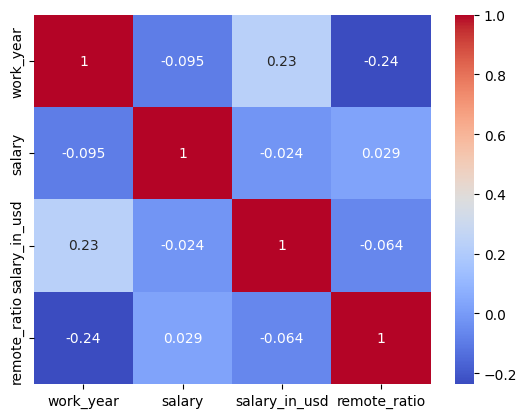

In [14]:
sns.heatmap(df.select_dtypes([int, float]).corr(), annot=True, cmap="coolwarm")
plt.show()

Отличные корреляции между числовыми признаками!

## **Задание 3 (0.3 балла)**

Вернитесь к описанию признаков.
- Проверьте, все ли признаки соответствуют постановке задачи? Если есть лишние признаки, удалите их и обоснуйте удаление, если нет, сделайте вывод о релевантности (достаточно в одну-две строки)
- Зафиксируйте, в каких признаках много категорий.

In [15]:
df.head()

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2023,SE,FT,Principal Data Scientist,80000,EUR,85847,ES,100,ES,L
1,2023,MI,CT,ML Engineer,30000,USD,30000,US,100,US,S
2,2023,MI,CT,ML Engineer,25500,USD,25500,US,100,US,S
3,2023,SE,FT,Data Scientist,175000,USD,175000,CA,100,CA,M
4,2023,SE,FT,Data Scientist,120000,USD,120000,CA,100,CA,M


**Ваши выводы здесь**
- Все признаки соответствуют постановке задачи, кроме, может быть `work_year`. Думаю, что все же стоит включить, у нас есть данные с 2020-2023 годы, поэтому заработная плата могла меняться со временем. Другие же признаки напрямую влияют на целевую переменную.
- В предыдущем пункте было замечено, что в столбцах `job_title`, `salary_currency`, `employee_residence` и	`company_location` много уникальных значений.

## **Задание 4 (0.2 балла)**

Разделите выборку на train, test (80%, 20%).

In [16]:
X_train, X_test, y_train, y_test = train_test_split(df.drop(['salary_in_usd'], axis=1), df['salary_in_usd'], test_size=0.2, random_state=42)

## **Задание 5 (0.3 балла)**

Будем проверять два сценария. Первый — построение модели только на непрерывных признаках, а второй — построение с категориальными. В этом задании подготовьте всё, чтобы проверить валидность обоих сценариев. А именно:

- Выделите данные для тренировки и теста для непрерывных признаков
- Выделите данные для тренировки и теста для непрерывных + категориальных признаков, пока ничего не кодируйте.

In [17]:
num_cols = df.select_dtypes(include=['int', 'float']).columns
cat_cols = df.select_dtypes(include=['object']).columns

X_train_num, X_test_num, y_train, y_test = train_test_split(df[num_cols].drop(['salary_in_usd'], axis=1), df['salary_in_usd'], test_size=0.2, random_state=42)
X_train_cat, X_test_cat, y_train, y_test = train_test_split(df[cat_cols], df['salary_in_usd'], test_size=0.2, random_state=42)

## **Задание 6 (0.2 балла)**

- Обучите модель линейной регресии на числовых признаках и оцените её качество через mape и rmse;
- Сделайте вывод о качестве построенной модели;

In [18]:
lr = LinearRegression()
lr.fit(X_train_num, y_train)
lr_pred = lr.predict(X_test_num)

print(f"MAPE: {round(mean_absolute_percentage_error(y_test, lr_pred)*100, 2)}%")
print(f"RMSE: {round(mean_squared_error(y_test, lr_pred)**(0.5), 2)}")

MAPE: 70.63%
RMSE: 61363.89


Получили плохой показатель MAPE, и плохой для задачи предсказания заработной платы RMSE(ошибка больше 60k). Это может указывать на то, что в данных есть выбросы, и RMSE сильно за них штрафует. Но также слабый MAPE говорит о том, что в целом модель в процентном выражении сильно ошибается. Таким образом, возможно просто линейная регрессия не совсем хороший вариант модели, выбранный для решения этой задачи.

## **Задание 8 (0.2 балла)**

- Обучите модель бустинга (любую из трех библиотек catboost, xgboost, lightgbm) с гиперпараметрами по умолчанию на непрерывных признаках и оцените её качество через mape и rmse;
- Сделайте вывод о качестве построенной модели;

In [19]:
cb = CatBoostRegressor(verbose=False)
cb.fit(X_train_num, y_train)
cb_pred = cb.predict(X_test_num)

print(f"MAPE: {round(mean_absolute_percentage_error(y_test, cb_pred)*100, 2)}%")
print(f"RMSE: {round(mean_squared_error(y_test, cb_pred)**(0.5), 2)}")

MAPE: 10.88%
RMSE: 13369.71


Catboost показал себя намног лучше, чем линейная регрессия, что ожидаемо. Понизились MAPE и RMSE, в среднем предсказания отличаются на 10%, а ошибка в долларах относительно настоящих заработных плат составляет ужк 13к$.

## **Задание 9 (0.8 балла)**

Теперь подключим категориальные признаки. Но попроубем разные стратегии предобработки.

**1:**
- Предобработайте категориальные признаки при помощи OHE
- Постройте модель бустинга и линейную регрессию
- Оцените качество обеих моделей

**2:**
- Предобработайте категориальные признаки при помощи LabelEncoding
- Постройте модель бустинга и линейную регрессию
- Оцените качество обеих моделей

**3:**
- Предобработайте категориальные признаки при помощи MeanTargetEnc
- Постройте модель бустинга и линейную регрессию
- Оцените качество обеих моделей

Сделайте выводы по построениям 1-3. Выберите лучшую модель и дальше поработайте с ней.

In [20]:
ohe_lr_pipeline = Pipeline([
    ('encoder_', OneHotEncoder(cols=cat_cols)),
    ('model_', LinearRegression())
])
ohe_cb_pipeline = Pipeline([
    ('encoder_', OneHotEncoder(cols=cat_cols)),
    ('model_', CatBoostRegressor(verbose=False))
])


label_lr_pipeline = Pipeline([
    ('encoder_', OrdinalEncoder(cols=cat_cols)),
    ('model_', LinearRegression())
])
label_cb_pipeline = Pipeline([
    ('encoder_', OrdinalEncoder(cols=cat_cols)),
    ('model_', CatBoostRegressor(verbose=False))
])


target_lr_pipeline = Pipeline([
    ('encoder_', TargetEncoder(cols=cat_cols)),
    ('model_', LinearRegression())
])
target_cb_pipeline = Pipeline([
    ('encoder_', TargetEncoder(cols=cat_cols)),
    ('model_', CatBoostRegressor(verbose=False))
])

In [21]:
model_names = ['LinearRegression + OHE', 'CatBoost + OHE', 'LinearRegression + OrdinalEncoder',
               'CatBoost + OrdinalEncoder', 'LinearRegression + MeanTargetEnc', 'CatBoost + MeanTargetEnc']
pipelines = [ohe_lr_pipeline, ohe_cb_pipeline, label_lr_pipeline, label_cb_pipeline, target_lr_pipeline, target_cb_pipeline]

for models, pipe in enumerate(pipelines):
    pipe.fit(X_train, y_train)
    pred_pipeline = pipe.predict(X_test)
    print(f'{model_names[models]}:')
    print(f'- MAPE: {round(mean_absolute_percentage_error(y_test, pred_pipeline)*100, 2)}%')
    print(f'- RMSE: {round(mean_squared_error(y_test, pred_pipeline)**(0.5), 2)}\n')

LinearRegression + OHE:
- MAPE: 53.07%
- RMSE: 52302.74

CatBoost + OHE:
- MAPE: 3.43%
- RMSE: 4246.93

LinearRegression + OrdinalEncoder:
- MAPE: 57.9%
- RMSE: 58193.73

CatBoost + OrdinalEncoder:
- MAPE: 2.82%
- RMSE: 8150.48

LinearRegression + MeanTargetEnc:
- MAPE: 40.06%
- RMSE: 48548.55

CatBoost + MeanTargetEnc:
- MAPE: 4.49%
- RMSE: 9670.89



В этом задании я взял вместо LabelEncoder из sklearn OrdinalEncoder из category_encoders для простоты кода и возможности включить его в пайплайн. К тому же LabelEncoder не обрабатывает новые данные, которые могут попасть в тестовую выборку.

**Выводы:**
- наименьший MAPE при CatBoost + OrdinalEncoder
- наименьший RMSE при CatBoost + OHE
- скорее всего лучшая модель: CatBoost + OHE, так как в отличие от OrdinalEncoder не вносит в модель возможный порядок значений, тем более разница с MAPE CatBoost + OrdinalEncoder <1%
- результаты показывают, что в задаче прогнозирования заработной платы на данном датасете линейная регрессия с учётом закодированных категориальных переменных значительно уступает бустингу

## **Задание 10 (0.5 балла)**

Покажите, где ошибается ваша модель. Выведите топ 20 примеров с наибольшей ошибкой. Проанализируйте их. Какие выводы можно сделать? Что стоит изменить в данных чтобы улучшить качество модели?

In [22]:
ohe_cb_pipeline.fit(X_train, y_train)
pred_ohe_cb = ohe_cb_pipeline.predict(X_test)
errors = abs(pred_ohe_cb - y_test)
errors_2 = round(mean_absolute_percentage_error(y_test, pred_pipeline)*100, 5)
errors_3 = round(mean_squared_error(y_test, pred_pipeline)**(0.5), 5)

X_test_error_analysis = X_test.copy()
X_test_error_analysis['true_salary'] = y_test
X_test_error_analysis['predicted_salary'] = pred_ohe_cb
X_test_error_analysis['error'] = errors
X_test_error_analysis['error_MAPE'] = errors_2
X_test_error_analysis['error_RMSE'] = errors_3

X_test_error_analysis = X_test_error_analysis.sort_values(by='error_RMSE', ascending=False)

In [23]:
X_test_error_analysis.head(20)

,work_year,experience_level,employment_type,job_title,salary,salary_currency,employee_residence,remote_ratio,company_location,company_size,true_salary,predicted_salary,error,error_MAPE,error_RMSE
2148,2022,SE,FT,Machine Learning Software Engineer,168000,USD,CA,100,CA,M,168000,168830.265005,830.265005,4.48605,9670.89154
1846,2022,SE,FT,Data Scientist,51000,USD,US,100,US,M,51000,51655.710367,655.710367,4.48605,9670.89154
2110,2022,SE,FT,Data Engineer,220000,USD,US,100,US,M,220000,219290.517225,709.482775,4.48605,9670.89154
157,2023,MI,FT,Data Analyst,38000,GBP,GB,0,GB,M,46178,46721.339235,543.339235,4.48605,9670.89154
2754,2022,SE,FT,Data Analyst,110000,USD,US,0,US,M,110000,111190.304088,1190.304088,4.48605,9670.89154
912,2023,MI,FT,Data Engineer,154000,USD,US,0,US,M,154000,156166.571785,2166.571785,4.48605,9670.89154
551,2023,MI,FT,Data Engineer,149600,USD,US,0,US,M,149600,149394.897697,205.102303,4.48605,9670.89154
152,2023,SE,FT,Analytics Engineer,143200,USD,US,0,US,M,143200,144223.741282,1023.741282,4.48605,9670.89154
1468,2023,MI,FT,Data Analyst,206000,USD,US,0,US,M,206000,208026.483556,2026.483556,4.48605,9670.89154
3041,2022,SE,FT,Data Engineer,131300,USD,US,100,US,L,131300,130099.986347,1200.013653,4.48605,9670.89154


**Выводы:**
- во всех типах ошибок: в абсолютном отклонении, MAPE и RMSE в топ-20 в основном объекты с `employment_type`= "FT"
- если анализировать по MAPE и RMSE, то можно заметить, что наибльшая ошибка в основном у объектов с `salary_currency`= "USD"
- возможно имеет смысл добавить новые признаки, например, посмотреть на качество модели после объединения признаков `employee_residence` и `company_location`
- возможно, имеет смысл масштабировать данные

## **Задание 11 (0.5 балла)**

Придумайте признаки для улучшения качества модели на основе предыдущего пункта. Как вам кажется какими признаками можно улучшить качетсво модели? Реализуйте признаки и проверьте улучшилось ли качество модели.

**Примечание:**
Полный балл за задание ставится даже при отсутствии улучшения качества модели, важно попробовать проверить свои гипотезы и сделать выводы.

In [24]:
num_cols_train = X_train.select_dtypes(include=['int', 'float']).columns.tolist()

In [25]:
cb_pipeline = Pipeline([
    ('encoder_', OneHotEncoder(cols=cat_cols)),
    ('preprocessor_', PolynomialFeatures(degree=2)),
    ('model_', CatBoostRegressor(verbose=False))
])

In [26]:
cb_pipeline.fit(X_train, y_train)
pred_pipeline = cb_pipeline.predict(X_test)

print(f'- MAPE: {round(mean_absolute_percentage_error(y_test, pred_pipeline)*100, 2)}%')
print(f'- RMSE: {round(mean_squared_error(y_test, pred_pipeline)**(0.5), 2)}\n')

- MAPE: 2.07%
- RMSE: 2558.67



In [27]:
cb_pipeline = Pipeline([
    ('encoder2_', OrdinalEncoder(cols= cat_cols)),
    ('preprocessor_', PolynomialFeatures(degree=3)),
    ('model_', CatBoostRegressor(verbose=False))
])

In [28]:
cb_pipeline.fit(X_train, y_train)
pred_pipeline = cb_pipeline.predict(X_test)

print(f'- MAPE: {round(mean_absolute_percentage_error(y_test, pred_pipeline)*100, 2)}%')
print(f'- RMSE: {round(mean_squared_error(y_test, pred_pipeline)**(0.5), 2)}\n')

- MAPE: 3.29%
- RMSE: 7627.84



In [29]:
preprocessor = ColumnTransformer(
    transformers=[
        ('encoder', OneHotEncoder(), cat_cols.tolist()),
        ('scaler', StandardScaler(), num_cols_train),
    ],
    remainder='passthrough'
)

pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', CatBoostRegressor(verbose=False))
])

In [30]:
pipeline.fit(X_train, y_train)
pred_pipeline = pipeline.predict(X_test)

print(f'- MAPE: {round(mean_absolute_percentage_error(y_test, pred_pipeline)*100, 5)}%')
print(f'- RMSE: {round(mean_squared_error(y_test, pred_pipeline)**(0.5), 5)}\n')

- MAPE: 3.42712%
- RMSE: 4246.92792



**Ответ:** Хоть мы и получили лучшие результаты для OHE + PolynomialFeatures(degree=2) + CatBoost, но время работы такого алгоритма очень большое. Поэтому в качестве лучшей модели возьмем просто OHE + StandardScaler + CatBoost, у которых MAPE=3.427%, a RMSE = 4246.93.

## **Задание 12 (1 балл)**

Поупражняемся с разными бустингами!

- Используйте catboost.
- Обучите модель — на полном наборе данных с категориальными признаками.
- Подберите оптимальные гиперпараметры.
- Оцените качество итоговой модели, скорость обучения и скорость предсказания.


**Примечание:**
Замерять скорость = смотреть, как долго исполняется код.

In [31]:
cb = CatBoostRegressor(verbose=False, cat_features=cat_cols.tolist(), random_state=RANDOM_STATE)

param_distributions_cb = {
    'iterations': [200, 300, 500, 700, 1000],
    'depth': [1, 3, 5, 7],
    'learning_rate': [0.01, 0.3, 0.5],
    'l2_leaf_reg': [1, 3, 5, 7],
    'min_data_in_leaf': [1, 3, 5, 10, 20, 50]
}

random_search_cb = RandomizedSearchCV(
    estimator=cb,
    param_distributions=param_distributions_cb,
    n_iter=50,
    cv=3,
    verbose=3,
    scoring='r2',
    random_state=RANDOM_STATE
)

In [32]:
%%time
random_search_cb.fit(X_train, y_train)

Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV 1/3] END depth=1, iterations=500, l2_leaf_reg=3, learning_rate=0.3, min_data_in_leaf=1;, score=0.836 total time=   0.8s
[CV 2/3] END depth=1, iterations=500, l2_leaf_reg=3, learning_rate=0.3, min_data_in_leaf=1;, score=0.899 total time=   0.3s
[CV 3/3] END depth=1, iterations=500, l2_leaf_reg=3, learning_rate=0.3, min_data_in_leaf=1;, score=0.961 total time=   0.4s
[CV 1/3] END depth=3, iterations=700, l2_leaf_reg=3, learning_rate=0.3, min_data_in_leaf=50;, score=0.930 total time=   2.7s
[CV 2/3] END depth=3, iterations=700, l2_leaf_reg=3, learning_rate=0.3, min_data_in_leaf=50;, score=0.991 total time=   1.4s
[CV 3/3] END depth=3, iterations=700, l2_leaf_reg=3, learning_rate=0.3, min_data_in_leaf=50;, score=0.986 total time=   1.4s
[CV 1/3] END depth=3, iterations=500, l2_leaf_reg=5, learning_rate=0.3, min_data_in_leaf=5;, score=0.933 total time=   1.0s
[CV 2/3] END depth=3, iterations=500, l2_leaf_reg=5, learning_rate=

RandomizedSearchCV(cv=3,
                   estimator=<catboost.core.CatBoostRegressor object at 0x7b952590f1d0>,
                   n_iter=50,
                   param_distributions={'depth': [1, 3, 5, 7],
                                        'iterations': [200, 300, 500, 700,
                                                       1000],
                                        'l2_leaf_reg': [1, 3, 5, 7],
                                        'learning_rate': [0.01, 0.3, 0.5],
                                        'min_data_in_leaf': [1, 3, 5, 10, 20,
                                                             50]},
                   random_state=42, scoring='r2', verbose=3)

In [33]:
%%time

best_cb = random_search_cb.best_estimator_
best_cb_pred = best_cb.predict(X_test)

print("Лучшие гиперпараметры: ", random_search_cb.best_params_)
print("r2_score (test): ", r2_score(y_test, best_cb_pred))
print("RMSE (test): ", (mean_squared_error(y_test, best_cb_pred))**(0.5))
print("MAPE (test): ", mean_absolute_percentage_error(y_test, best_cb_pred))

Лучшие гиперпараметры:  {'min_data_in_leaf': 50, 'learning_rate': 0.3, 'l2_leaf_reg': 3, 'iterations': 700, 'depth': 3}
r2_score (test):  0.9887092584639605
RMSE (test):  6676.336920090596
MAPE (test):  0.0696738106368466
CPU times: user 17.6 ms, sys: 0 ns, total: 17.6 ms
Wall time: 24.7 ms


## **Задание 13 (1 балл)**

- Используйте xgboost.
- Обучите модель — на полном наборе данных с категориальными признаками. Стратегию кодирования оставьте ту, что показала себя лучшей в пункте 9.
- Подберите оптимальные гиперпараметры.
- Оцените качество итоговой модели, скорость обучения и скорость предсказания.



In [34]:
preprocessor = ColumnTransformer(
    transformers=[
        ('encoder', OneHotEncoder(), cat_cols.tolist()),
        ('scaler', StandardScaler(), num_cols_train)
    ],
    remainder='passthrough'
)
X_train_new = preprocessor.fit_transform(X_train)
X_test_new = preprocessor.transform(X_test)

In [35]:
model_xgb = XGBRegressor()

param_distributions = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5, 6, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'gamma': [0, 0.1, 0.2],
    'reg_lambda': [0, 1, 10]
}

random_search_xgb = RandomizedSearchCV(
    estimator=model_xgb,
    param_distributions=param_distributions,
    n_iter=50,
    cv=3,
    verbose=2,
    random_state=RANDOM_STATE
)

In [36]:
%%time
random_search_xgb.fit(X_train_new, y_train)

Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV] END gamma=0, learning_rate=0.1, max_depth=5, n_estimators=200, reg_lambda=1; total time=   2.2s
[CV] END gamma=0, learning_rate=0.1, max_depth=5, n_estimators=200, reg_lambda=1; total time=   0.7s
[CV] END gamma=0, learning_rate=0.1, max_depth=5, n_estimators=200, reg_lambda=1; total time=   0.2s
[CV] END gamma=0.1, learning_rate=0.1, max_depth=7, n_estimators=50, reg_lambda=10; total time=   0.2s
[CV] END gamma=0.1, learning_rate=0.1, max_depth=7, n_estimators=50, reg_lambda=10; total time=   0.2s
[CV] END gamma=0.1, learning_rate=0.1, max_depth=7, n_estimators=50, reg_lambda=10; total time=   0.2s
[CV] END gamma=0.2, learning_rate=0.2, max_depth=5, n_estimators=200, reg_lambda=1; total time=   0.3s
[CV] END gamma=0.2, learning_rate=0.2, max_depth=5, n_estimators=200, reg_lambda=1; total time=   0.3s
[CV] END gamma=0.2, learning_rate=0.2, max_depth=5, n_estimators=200, reg_lambda=1; total time=   0.2s
[CV] END gamma=0,

RandomizedSearchCV(cv=3,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, device=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=...
                                          max_leaves=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          multi_strategy=None,
                                          n_estimators=None, n_jobs=None,
                                          num_parallel_tree=None,
                                          random_state=None, ...),
                   n_iter=50,
                   param_distributions={'gamma': [0, 0.1, 0.2],
                                        'learning_rate': [0.01, 0.1, 0.2],
                                        'max_depth': [3, 4, 5, 6, 7],
                                        'n_estimators': [50, 100, 200],
                                        'reg_lambda': [0, 1, 10]},
                   random_state=42, verbose=2)

In [37]:
%%time

best_xgb = random_search_xgb.best_estimator_
best_xgb_pred = random_search_xgb.predict(X_test_new)

print("Лучшие гиперпараметры: ", random_search_xgb.best_params_)
print("r2_score (test): ", r2_score(y_test, best_xgb_pred))
print("RMSE (test): ", (mean_squared_error(y_test, best_xgb_pred))**(0.5))
print("MAPE (test): ", mean_absolute_percentage_error(y_test, best_xgb_pred))

Лучшие гиперпараметры:  {'reg_lambda': 1, 'n_estimators': 200, 'max_depth': 3, 'learning_rate': 0.2, 'gamma': 0.1}
r2_score (test):  0.9959477186203003
RMSE (test):  3999.6821123684317
MAPE (test):  0.027954543009400368
CPU times: user 16.2 ms, sys: 980 µs, total: 17.1 ms
Wall time: 11 ms


## **Задание 14 (1 балл)**

- Используйте lgbm.
- Обучите модель — на полном наборе данных с категориальными признаками. Стратегию кодирования оставьте ту, что показала себя лучшей в пункте 9.
- Подберите оптимальные гиперпараметры.
- Оцените качество итоговой модели, скорость обучения и скорость предсказания.


In [38]:
model_lgb = lgb.LGBMRegressor(verbose=-1)

param_distributions_lgb = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5, 6, 7],
    'learning_rate': [0.01, 0.1, 0.2],

    'min_data_in_leaf': [5, 10, 20, 50],

    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'reg_alpha': [0, 1, 5, 10, 50],
    'reg_lambda': [0, 1, 5, 10, 50]

    # 'num_leaves': [30, 63, 127],

}


random_search_lgb = RandomizedSearchCV(
    estimator=model_lgb,
    param_distributions=param_distributions_lgb,
    n_iter=100,
    cv=3,
    verbose=2,
    random_state=RANDOM_STATE
)

In [39]:
%%time
random_search_lgb.fit(X_train_new, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=20, n_estimators=50, reg_alpha=10, reg_lambda=0, subsample=0.6; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=20, n_estimators=50, reg_alpha=10, reg_lambda=0, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=5, min_data_in_leaf=20, n_estimators=50, reg_alpha=10, reg_lambda=0, subsample=0.6; total time=   0.0s
[CV] END colsample_bytree=0.6, learning_rate=0.01, max_depth=3, min_data_in_leaf=50, n_estimators=200, reg_alpha=5, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.6, learning_rate=0.01, max_depth=3, min_data_in_leaf=50, n_estimators=200, reg_alpha=5, reg_lambda=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.6, learning_rate=0.01, max_depth=3, min_data_in_leaf=50, n_estimators=200, reg_alpha=5, r

RandomizedSearchCV(cv=3, estimator=LGBMRegressor(verbose=-1), n_iter=100,
                   param_distributions={'colsample_bytree': [0.6, 0.8, 1.0],
                                        'learning_rate': [0.01, 0.1, 0.2],
                                        'max_depth': [3, 4, 5, 6, 7],
                                        'min_data_in_leaf': [5, 10, 20, 50],
                                        'n_estimators': [50, 100, 200],
                                        'reg_alpha': [0, 1, 5, 10, 50],
                                        'reg_lambda': [0, 1, 5, 10, 50],
                                        'subsample': [0.6, 0.8, 1.0]},
                   random_state=42, verbose=2)

In [40]:
%%time

best_lgb = random_search_lgb.best_estimator_
best_lgb_pred = random_search_lgb.predict(X_test_new)

print("Лучшие гиперпараметры: ", random_search_lgb.best_params_)
print("r2_score (test): ", r2_score(y_test, best_lgb_pred))
print("RMSE (test): ", (mean_squared_error(y_test, best_lgb_pred))**(0.5))
print("MAPE (test): ", mean_absolute_percentage_error(y_test, best_lgb_pred))

Лучшие гиперпараметры:  {'subsample': 0.8, 'reg_lambda': 50, 'reg_alpha': 10, 'n_estimators': 100, 'min_data_in_leaf': 10, 'max_depth': 5, 'learning_rate': 0.2, 'colsample_bytree': 1.0}
r2_score (test):  0.9904621797244336
RMSE (test):  6136.229292989375
MAPE (test):  0.03676546832088796
CPU times: user 6.61 ms, sys: 2.73 ms, total: 9.34 ms
Wall time: 10.1 ms


## **Задание 15 (0.4 балла)**

Сделайте выводы про модели и решение задачи.

- Какая из моделей показала лучший результат по качеству?
- Какая из моделей показала лучший результат по качеству, скорости обучения и скорости предсказания в совокупности?
- Насколько бустинги превзошли линейную модель? Целесообразно ли их использование?

CatBoost:  
- Лучшие гиперпараметры:  {'min_data_in_leaf': 50, 'learning_rate': 0.3, 'l2_leaf_reg': 3, 'iterations': 700, 'depth': 3}
- r2_score (test):  0.9887092584639605
- RMSE (test):  6676.336920090596
- total time fit: ~ 8min 31s

XGBoost:
- Лучшие гиперпараметры:  {'reg_lambda': 1, 'n_estimators': 200, 'max_depth': 3, 'learning_rate': 0.2, 'gamma': 0.1}
- r2_score (test):  0.9959477186203003
- RMSE (test):  3999.6821123684317
- MAPE (test):  0.027954543009400368
- total time fit: ~ 1min 56s

LGBM:
- Лучшие гиперпараметры:  {'subsample': 0.8, 'reg_lambda': 50, 'reg_alpha': 10, 'n_estimators': 100, 'min_data_in_leaf': 10, 'max_depth': 5, 'learning_rate': 0.2, 'colsample_bytree': 1.0}
- r2_score (test):  0.9904621797244336
- RMSE (test):  6136.229292989375
- MAPE (test):  0.03676546832088796
- total time fit: ~ 22.8 s


Лучший результат показал XGBoost. Самый быстрый алгоритм - LGBM. По идее лучший результат должен был предсказать CatBoost, но, видимо, гиперпараметры были подобраны не правильно. Ожидаемо по времени самый долгий алгоритм - CatBoost, а самый быстрый - LGBM. Но в совокупности лучшим можно назвать XGBoost, так как алгоритм достаточно быстро справился с задачей и показал наилучший результат на всех метриках.

Все бустинги превзошли линейную модель, что говорит о нецелесообразности использования линейных моделей для решения данной задачи.





# **Часть 2: кластеризация типов движений**
**Количество баллов:** 3

В этой части будем работать с набором данных Samsung Human Activity Recognition. Набор данных заранее предобработан и снова доступен вам по [ссылке](https://drive.google.com/file/d/16ISu7lMumt5rbticbOggHMRjwTGBETtO/view?usp=sharing).

### **Постановка задачи**
Данные поступают с акселерометров и гироскопов мобильных телефонов Samsung Galaxy S2. Вид активности человека с телефоном в кармане известен:
- 1 - ходьба,
- 2 - подъем вверх по лестнице,
- 3 - спуск по лестнице,
- 4 - сидение,
- 5 - стояние,
- 6 - лежание


Представим, что вид активности нам неизвестнен, и попробуем кластеризовать людей чисто на основе имеющихся признаков.

In [41]:
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering


plt.style.use(['seaborn-v0_8-darkgrid'])
plt.rcParams['figure.figsize'] = (12, 9)
plt.rcParams['font.family'] = 'DejaVu Sans'

%matplotlib inline
%config InlineBackend.figure_format="retina"

RANDOM_STATE = 42

### **Задание 16 (0.1 балл)**
Прочитайте данные из файлов и объедните тестовую и обучающие выборки.

В файлах ```..._labels``` лежат настоящие классы. Их также объедините, но в отдельную переменную (например ```y```). Данный вектор для кластеризации нам не нужен, но мы будем смотреть по нему метрики.

In [43]:
train_data = pd.read_csv('samsung_train.txt', delim_whitespace=True, header=None)
test_data = pd.read_csv('samsung_test.txt', delim_whitespace=True, header=None)

y_data_train = pd.read_csv('samsung_train_labels.txt', delim_whitespace=True, header=None)
y_data_test = pd.read_csv('samsung_test_labels.txt', delim_whitespace=True, header=None)

In [44]:
X = pd.concat([train_data, test_data], ignore_index=True)
y = pd.concat([y_data_train, y_data_test], ignore_index=True)

In [45]:
# убедимся, что y содержит нужные нам классы
np.unique(y)

array([1, 2, 3, 4, 5, 6])

### **Задание 17 (0.2 балла)**

Так как мы будем пользоваться метрическими алгоритмами, отмасштабируйте выборку с помощью ```StandardScaler```.

In [46]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

### **Задание 18 (0.5 балла)**

Данных много и размерность большая. Чтобы ускорить рещение задачи с точки зрения построения модели, мы используем методы **понижения размерности**.

- Понизьте размерность с помощью `PCA`, оставляя столько компонент, сколько нужно для того, чтобы объяснить как минимум 90% дисперсии отмасштабированных данных. Вам пригодится [документация](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)

**Примечание:**
Для этого сумма значений массива pca.explained_variance_ratio_ должна быть не меньше 0.9.  ```random_state``` используйте из объявленной в самом начале переменной ```RANDOM_STATE``` (42).

In [47]:
pca = PCA(random_state=RANDOM_STATE)
pca.fit(X_scaled)

PCA(random_state=42)

In [48]:
pca = PCA(n_components=0.9, random_state=RANDOM_STATE)
X_pca = pca.fit_transform(X_scaled)

print(f"Количество компонент для объяснения 90% дисперсии: {len(pca.components_)}")

Количество компонент для объяснения 90% дисперсии: 65


### **Задание 19 (0.2 балла)**

Визуализируйте данные в проекции на первые две главные компоненты. Используйте ```cmap="virdis"``` или любой другой, с которым будет красиво!

Можете раскрасить кластеры.

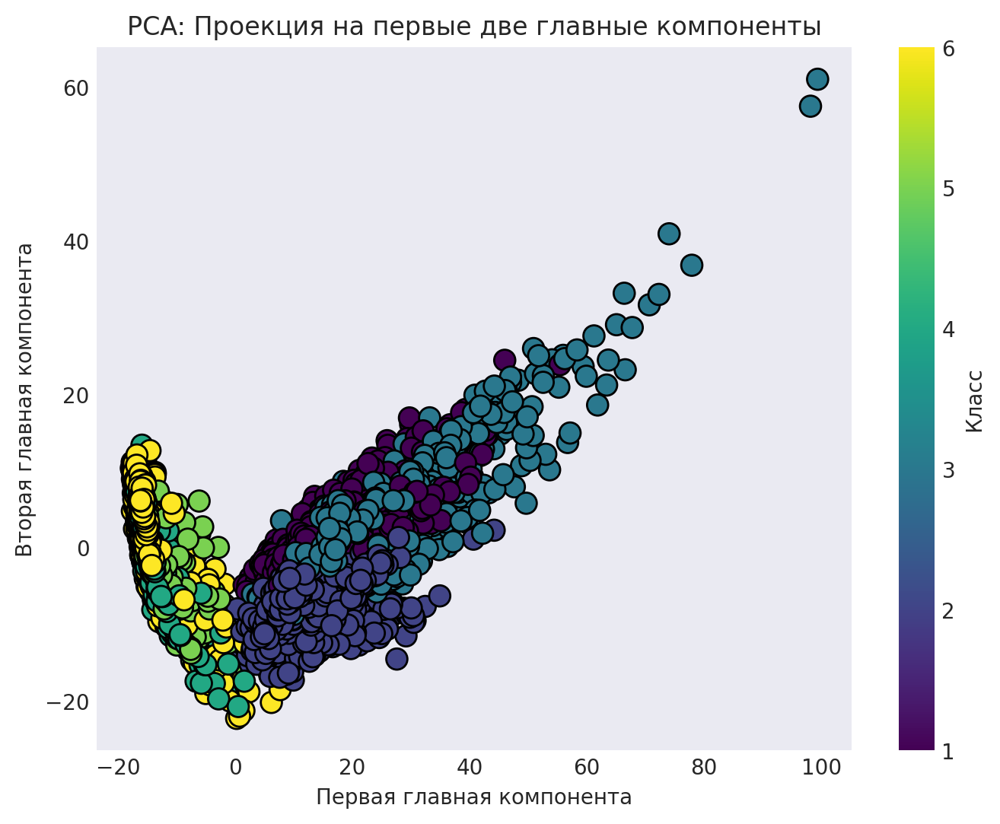

In [49]:
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y, cmap='viridis', edgecolor='k', s=100)
plt.title('PCA: Проекция на первые две главные компоненты')
plt.xlabel('Первая главная компонента')
plt.ylabel('Вторая главная компонента')
plt.colorbar(label='Класс')
plt.grid()
plt.show()

### **Задание 19. (0.5 балла)**

Разберёмся с `KMeans`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)

- Сделайте кластеризацию данных методом `KMeans`, обучив модель на данных со сниженной за счет `PCA` размерностью. Нужно искать 6 кластеров (изначально у нас 6 классов). Засеките время обучения и время инференса.

**Параметры обучения:**

```n_clusters = 6``` (число уникальных меток целевого класса = 6)

```n_init = 100```

```random_state = RANDOM_STATE``` (для воспроизводимости результата, не забывайте указывать его и дальше!)

In [50]:
kmeans = KMeans(n_clusters=6, n_init=100, random_state=RANDOM_STATE)

start_time = time.time()
kmeans.fit(X_pca)
end_time = time.time()

fit_time = end_time - start_time
print(f"Время обучения KMeans: {fit_time:.2f} секунд")

start_inference_time = time.time()
predictions_kmeans = kmeans.predict(X_pca)
end_inference_time = time.time()

inference_time = end_inference_time - start_inference_time
print(f"Время инференса KMeans: {inference_time:.2f} секунд")

Время обучения KMeans: 9.73 секунд
Время инференса KMeans: 0.00 секунд


### **Задание 20 (0.2 балла)**

- Визуализируйте данные в проекции на первые две главные компоненты.
- Раскрасьте точки в соответствии с полученными метками кластеров.

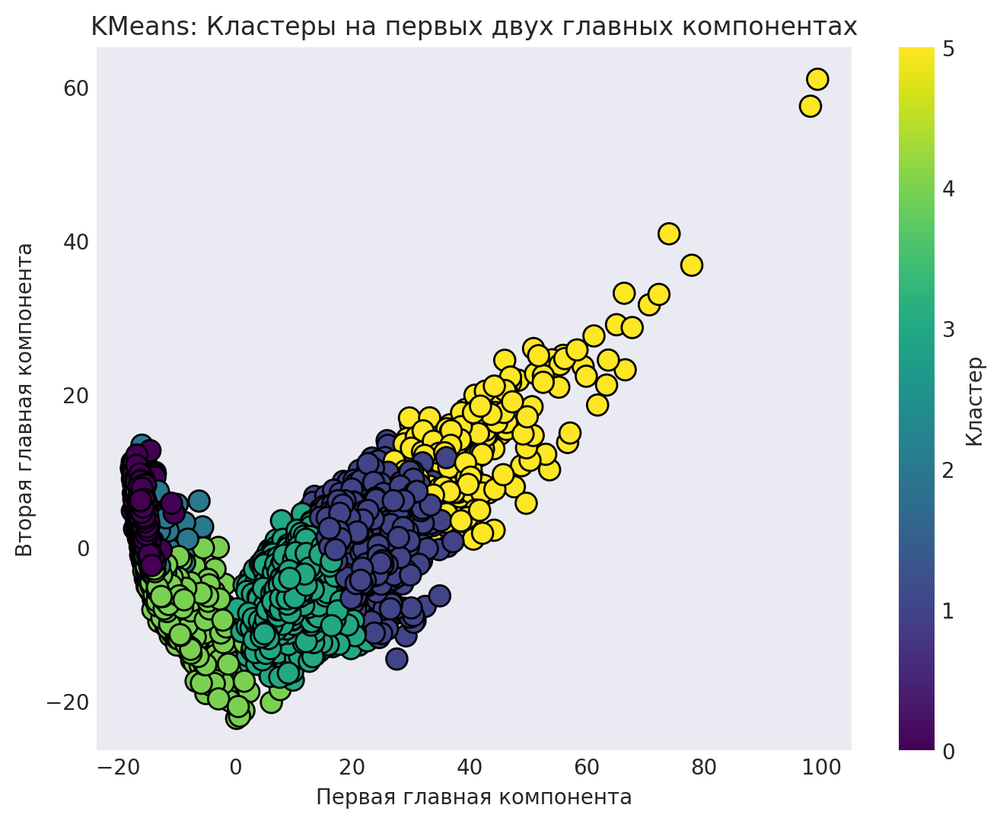

In [51]:
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=predictions_kmeans, cmap='viridis', edgecolor='k', s=100)
plt.title('KMeans: Кластеры на первых двух главных компонентах')
plt.xlabel('Первая главная компонента')
plt.ylabel('Вторая главная компонента')
plt.colorbar(label='Кластер')
plt.grid()
plt.show()

### **Задание 21 (0.3 балла)**

- Выберите какие-то метрики (минимум две) из известных вам. Объясните свой выбор
- Выведите на экран значения метрик качества, сделайте вывод о них и используйте их далее.

In [52]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_score, adjusted_rand_score, adjusted_mutual_info_score, v_measure_score

In [53]:
silhouette_avg = silhouette_score(X_pca, predictions_kmeans)
ari = adjusted_rand_score(np.array(y[0].tolist()), predictions_kmeans)
ami = adjusted_mutual_info_score(np.array(y[0].tolist()), predictions_kmeans)
v_measure = v_measure_score(np.array(y[0].tolist()), predictions_kmeans)

print(f"Силуэтный коэффициент: {silhouette_avg:.4f}")
print(f"Adjusted Rand Index (ARI): {ari:.4f}")
print(f"Adjusted Mutual Information (AMI): {ami:.4f}")
print(f"V-мера: {v_measure:.4f}")

Силуэтный коэффициент: 0.1415
Adjusted Rand Index (ARI): 0.4195
Adjusted Mutual Information (AMI): 0.5597
V-мера: 0.5600


**Вывод:**
- Силуэтный коэффициент (0.1415) является низким. Это означает, что точки находятся ближе к центрам других кластеров, чем к своему собственному центру. Чем ниже значение, тем хуже качество разделения на кластеры. Значение около нуля говорит о том, что кластеры накладываются друг на друга
- Adjusted Rand Index (ARI) получилось со значением 0.4195, которое находится между 0 и 1, где 1 соответствует идеальной согласованности между двумя разбиениями, а 0 — случайному совпадению. Такое значение ARI указывает на умеренную степень соответствия между реальной разметкой и результатами кластеризации. Однако оно недостаточно высокое, чтобы говорить о высоком качестве кластеризации
- Adjusted Mutual Information (AMI) получилось со значением 0.5597, которое также лежит между 0 и 1, где 1 обозначает полное соответствие между двумя распределениями. Хотя этот показатель немного лучше ARI, он всё ещё относительно низок, что говорит о средней точности распределения объектов по кластерам
- V-мерa (V-measure) получилось со значением 0.5600. Эта мера показывает соотношение гомогенности и полноты. Оно близко к значению AMI, что подтверждает среднюю точность кластеризации. Гомогенность описывает, насколько каждый кластер содержит объекты одного класса, тогда как полнота отражает, насколько все объекты одного класса собраны в одном кластере

В итоге, посмотрев на визуализацию, становится понятно, почему были получены такие результаты. Отдельные кластеры не определены чётко, и алгоритм Kmeans группирует объекты, расположенные близко друг к другу, объединяя их в один кластер.

### **Задание 22 (0.7 баллов)**

Теперь попробуем сделать кластеризацию с помощью `AgglomerativeClustering`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html)

- Засеките время обучения и время инференса. После кластеризации также:
  - Вновь визуализируйте данные с раскраской по полученным меткам
  - Выведите метрики. Засеките время обучения и время инференса. Сравните с ```KMeans```.

Ответьте на следующие вопросы:
* Стало ли лучше?
* Почему?

In [54]:
aggl_clust = AgglomerativeClustering(n_clusters=6)

start_time = time.time()
aggl_clust.fit(X_pca)
end_time = time.time()

fit_time = end_time - start_time
print(f"Время обучения AgglomerativeClustering: {fit_time:.2f} секунд")

start_time = time.time()
labels_agglo = aggl_clust.labels_
end_time = time.time()

inference_time_agglom = end_time - start_time
print(f"Время инференса AgglomerativeClustering: {inference_time:.2f} секунд")

Время обучения AgglomerativeClustering: 7.71 секунд
Время инференса AgglomerativeClustering: 0.00 секунд


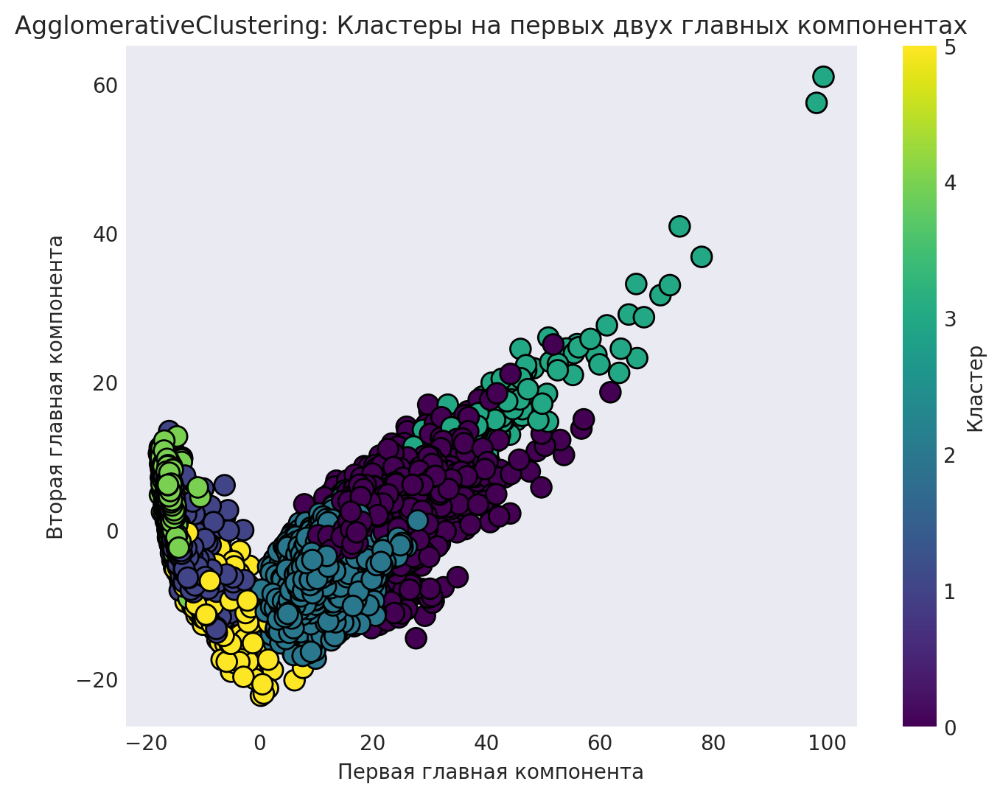

In [55]:
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels_agglo, cmap='viridis', edgecolor='k', s=100)
plt.title('AgglomerativeClustering: Кластеры на первых двух главных компонентах')
plt.xlabel('Первая главная компонента')
plt.ylabel('Вторая главная компонента')
plt.colorbar(label='Кластер')
plt.grid()
plt.show()

In [56]:
silhouette_avg = silhouette_score(X_pca, labels_agglo)
ari = adjusted_rand_score(np.array(y[0].tolist()), labels_agglo)
ami = adjusted_mutual_info_score(np.array(y[0].tolist()), labels_agglo)
v_measure = v_measure_score(np.array(y[0].tolist()), labels_agglo)

print(f"Силуэтный коэффициент: {silhouette_avg:.4f}")
print(f"Adjusted Rand Index (ARI): {ari:.4f}")
print(f"Adjusted Mutual Information (AMI): {ami:.4f}")
print(f"V-мера: {v_measure:.4f}")

Силуэтный коэффициент: 0.1366
Adjusted Rand Index (ARI): 0.4936
Adjusted Mutual Information (AMI): 0.6215
V-мера: 0.6218


**Вывод:**
- Силуэтный коэффициент (0.1366) является низким. Как и с Kmeans кластеры накладываются друг на друга, метрика даже чуть ниже
- Adjusted Rand Index (ARI) получилось со значением 0.4936. Такое значение ARI указывает на умеренную степень соответствия между реальной разметкой и результатами кластеризации. Хоть метрика чуть выше, чем у Kmeans, однако оно, как и с алгоритмом Kmeans недостаточно высокое, чтобы говорить о высоком качестве кластеризации
- Adjusted Mutual Information (AMI) получилось со значением 0.6215, которое тоже чуть выше, чем у Kmeans. Хотя этот показатель немного лучше ARI, он всё ещё относительно низок, что говорит о средней точности распределения объектов по кластерам
- V-мерa (V-measure) получилось со значением 0.6215. Это лучше, чем у Kmeans, но все же кластеризацию можно охарактеризовать как среднюю

В итоге, сравнивая Kmeans и AgglomerativeClustering можно сделать вывод, что AgglomerativeClustering лучше справляется с задачей, хотя оба алгоритма не идеальны.

### **Задание 23 (0.3 балла)**
Для самой успешной из полученных кластеризаций попробуйте дать интерпретацию кластеров. Опишите характеристики объектов, попавших в каждый кластер. Для этого можете ответить на следующие вопросы:

* Похожи ли объекты внутри каждого кластера на определенный тип активности человека?
* В каких кластерах смешано несколько типов активности? С чем, на ваш взгляд, это может быть связано?
* Качественная ли получилась кластеризация? На основании чего вы можете сделать такой вывод?

In [57]:
results_df = pd.DataFrame({
    'Predicted Cluster': labels_agglo + 1, # так как кластеры от 0 до 5 в кластеризации
    'True Cluster': np.array(y[0].tolist())
})

cluster_summary = results_df.groupby('True Cluster').mean()
cluster_summary

,Predicted Cluster
True Cluster,
1,2.085947
2,2.563472
3,1.460882
4,2.450760
5,2.155299
6,5.022634


**Выводы:**
- В качестве лучшей кластеризации была выбрана AgglomerativeClustering
- Если я правильно выполнил кластеризацию и сопоставил реальные кластеры предсказанным, то получилась плохая кластеризация

Вид активности человека с телефоном в кармане:
- 1 - ходьба,
- 2 - подъем вверх по лестнице,
- 3 - спуск по лестнице,
- 4 - сидение,
- 5 - стояние,
- 6 - лежание

In [58]:
results_df[results_df['True Cluster'] == 1].value_counts()

,,count
Predicted Cluster,True Cluster,
3,1,896
1,1,800
4,1,26



- получилось, что аггломеративная кластеризация хорошо предсказывает кластер 1, но путает его с кластером 3. Так как 1 - это ходьба, а 3 - спуск по лестнице, то понятно, что тут алгоритм хорошо справляется с задачей, так как ходьба и спуск по лестнице - похожие активности человека

In [59]:
results_df[results_df['True Cluster'] == 2].value_counts()

,,count
Predicted Cluster,True Cluster,
3,2,1207
1,2,337


- кластер 2 (подъем вверх по лестнице) ближе всего к третьему кластеру(спуск по лестнице), простительно, так как алгоритм нашел взаимосвязь - человек движется по лестнице, немного отличается от обычной ходьбы

In [60]:
results_df[results_df['True Cluster'] == 3].value_counts()

,,count
Predicted Cluster,True Cluster,
1,3,1144
3,3,138
4,3,124


- кластеры 3 и 1 часто путаются - подъем по лестнице алгоритм распознает как ходьбу, также почему-то иногда путаем с сидением

In [61]:
results_df[results_df['True Cluster'] == 4].value_counts()

,,count
Predicted Cluster,True Cluster,
2,4,1559
6,4,147
5,4,71


- кластер 4 (сидение) алгоритм вообще не предсказывает как сидение и путает его в основном с чаще всего путает с подъемом вверх по лестнице, иногда и предсказывает, что сидение - это стояние или лежание, что более приближено к сидению

In [62]:
results_df[results_df['True Cluster'] == 5].value_counts()

,,count
Predicted Cluster,True Cluster,
2,5,1832
6,5,74


- кластер 5 тоже плохо предсказан - предсказываются в основном подъем вверх по лестнице и иногда лежание, хотя кластер 5 - стояние

In [63]:
results_df[results_df['True Cluster'] == 6].value_counts()

,,count
Predicted Cluster,True Cluster,
5,6,1604
6,6,266
2,6,74


- кластер 6 (лежание) алгоритм чаще всего путает со стоянием, это похожие виды деятельности человека

В целом, можно отметить, что у алгоритма наблюдаются определенные сложности с предсказанием вида активности человека.

## **Бонус-задание (1 балл)**
![RedPanda](http://imgur.com/6Aa52Lm.png)

Алгоритмы кластеризации могут применяться в самых разных задачах. Например, в анализе изображений есть задача разделения изображения на семантические компоненты, которую можно решать в том числе с помощью алгоритмов кластеризации. В бонусе предлагаем вам попрактиковаться именно в этом на чудесной утке и совах (```duck.jpg``` и ```owls.jpg```)

### **(0.1 балл)**

- Откройте изображения, после чего визуализируйте их с помощью ```plt.imshow()```

In [109]:
import scipy as sp
import imageio
from skimage import color, transform, io
from sklearn.feature_extraction import image
from sklearn.cluster import spectral_clustering
from skimage import img_as_float
# from skimage.util import img_to_graph

In [64]:
from PIL import Image

duck = Image.open('duck.jpg')
owls = Image.open('Owls.jpg')

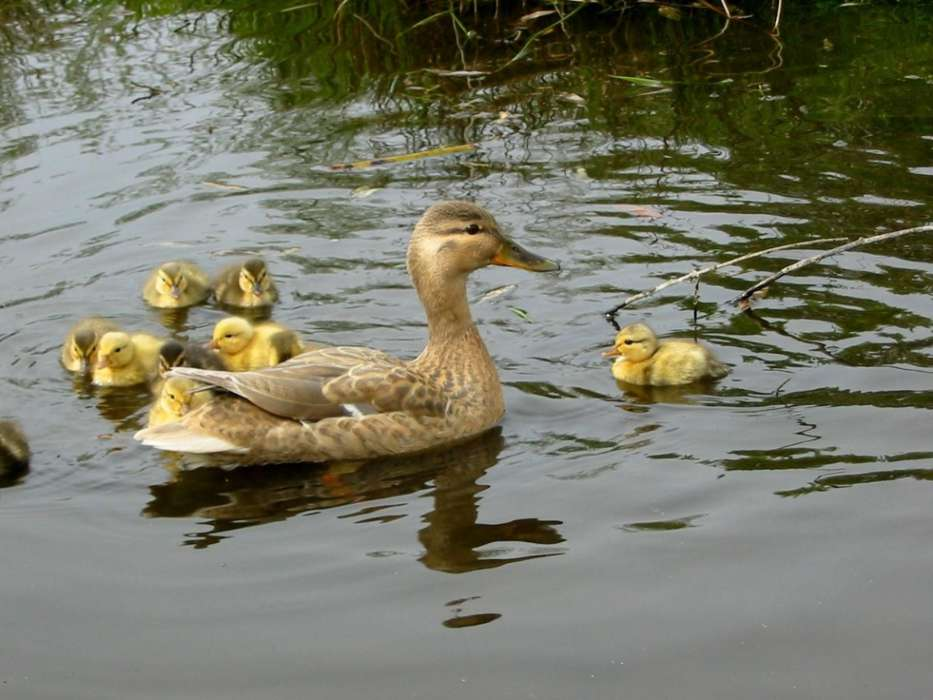

In [65]:
duck

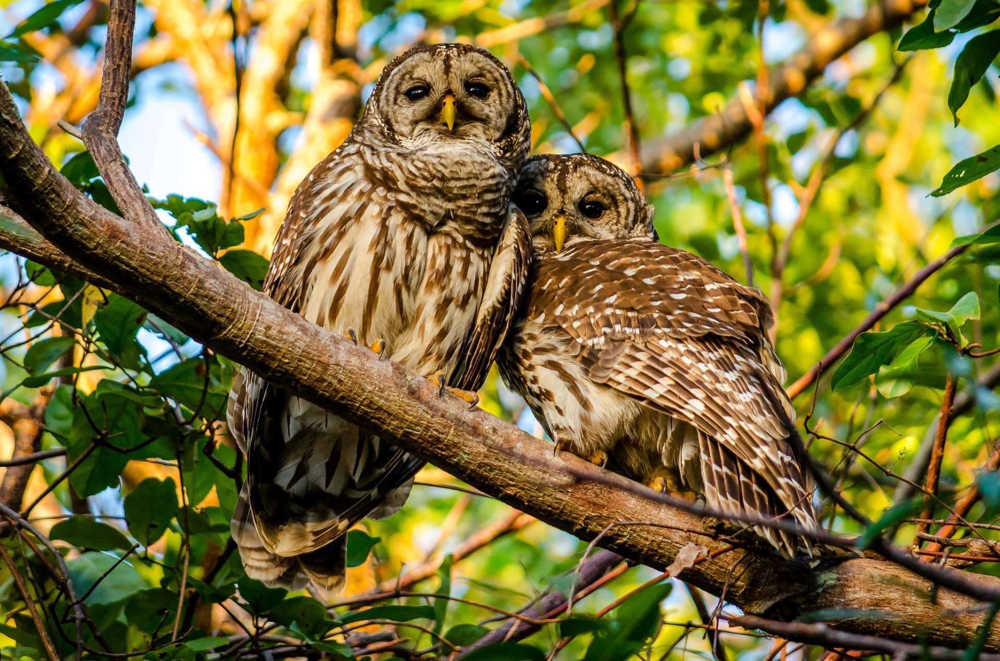

In [66]:
owls

### **(0.4 балла)**

Для каждого изображения, используя кластеризацию ```KMeans```, выделите компоненты, охарактеризовав каждый пиксель следующим образом: $$\psi_i = [\lambda x_i, \lambda y_i, r_i, g_i, b_i]$$
 где
- $x_i$ и $y_i$ — координаты пикселя,
- $r_i, g_i, b_i$ — его цвет,
- $\lambda$ — параметр, выражающий важность пространственной связности перед цветовой похожестью.

Примените полученную функцию, взяв следующие $\lambda$: 0.3 и 1.5 для ```duck.jpg``` и ```owls.jpg``` (или другие, но тогда с вас красивые результаты :) )

**Примечание:**
Число кластеров подберите разумным образом на свой вкус (в качестве нулевого приближения можно взять 3)

In [70]:
def find_components(image, lmbd, n_clusters):

    image = Image.open(image)
    image = image.convert('RGB')
    image_array = np.array(image)

    height, width, _ = image_array.shape
    pixels = []

    for y in range(height):
        for x in range(width):
            r, g, b = image_array[y, x]
            pixel_vector = [lmbd * x, lmbd * y, r, g, b]
            pixels.append(pixel_vector)

    pixels = np.array(pixels)
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(pixels)
    labels = kmeans.labels_

    segmented_image = np.zeros_like(image_array)
    for i in range(len(labels)):
        y = i // width
        x = i % width
        segmented_image[y, x] = kmeans.cluster_centers_[labels[i]][2:5]

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.title('Оригинальное изображение')
    plt.imshow(image_array)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title('Сегментированное изображение')
    plt.imshow(segmented_image.astype(np.uint8))
    plt.axis('off')

    plt.show()

    return labels

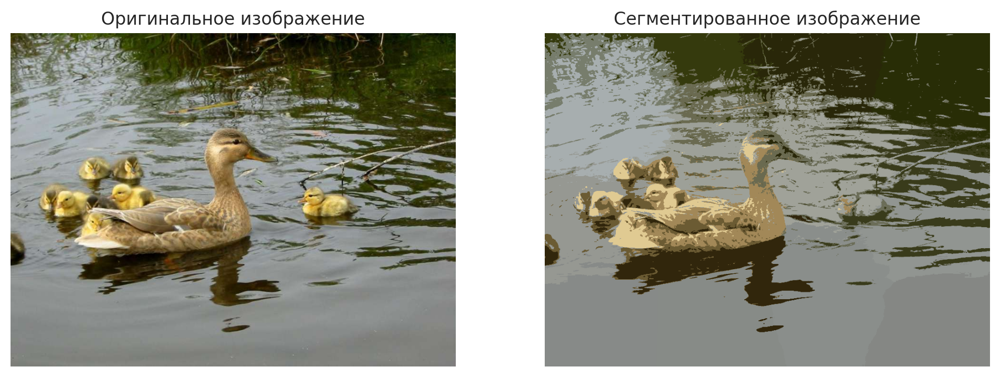

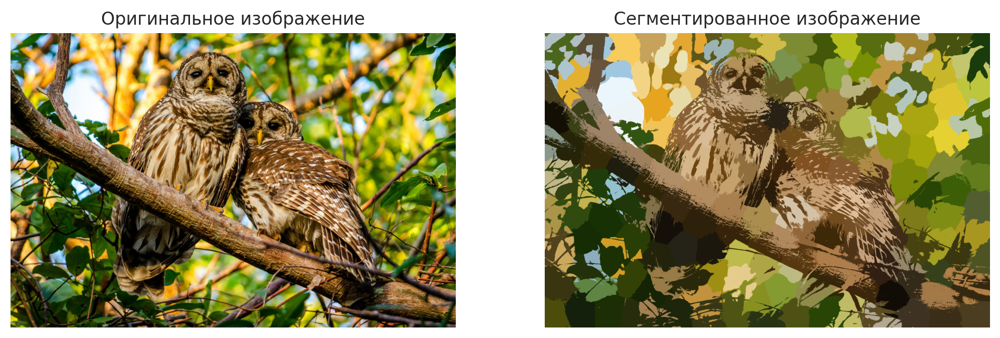

array([ 10,  10,  10, ..., 129, 129, 129], dtype=int32)

In [71]:
find_components('duck.jpg', lmbd=0.3, n_clusters=20)
find_components('Owls.jpg', lmbd=1.5, n_clusters=200)

### **(0.4 балла)**

Попробуйте выделить сегменты при помощи [спектральной кластеризации](http://scikit-learn.org/stable/modules/clustering.html#spectral-clustering). Обратите внимание на [пример в sklearn](http://scikit-learn.org/0.16/auto_examples/cluster/plot_lena_segmentation.html).


**Примечание:**

Для ускорения работы алгоритма рекомендуется привести изображение к серому цвету. При необходимости можно сжать изображения в 2 раза.

**Подсказка:**```skimage``` с его ```color``` и ```transform``` в этом помогут :)

Или же воспользуйтесь аналогичными средствами ```PIL``` или ```cv2```

In [105]:
def spectral_segmentation(picture, n_clusters, beta, eps):

    picture = imageio.imread(picture)
    image_gray = color.rgb2gray(picture)

    image_resized = transform.rescale(image_gray, 0.2, anti_aliasing=True)
    graph = image.img_to_graph(image_resized)
    graph.data = np.exp(-beta * graph.data / image_resized.std()) + eps

    for assign_labels in ('kmeans', 'discretize'):
        t0 = time.time()
        labels = spectral_clustering(graph, n_clusters=n_clusters,
                                    assign_labels=assign_labels,
                                    random_state=1)
        t1 = time.time()
        labels = labels.reshape(image_resized.shape)

        plt.figure(figsize=(5, 5))
        plt.imshow(image_resized, cmap=plt.cm.gray)
        for l in range(n_clusters):
            plt.contour(labels == l, contours=1, colors=[plt.cm.get_cmap("Spectral")(l / float(n_clusters)), ])
        plt.xticks(())
        plt.yticks(())
        plt.title('Spectral clustering: %s, %.2fs' % (assign_labels, (t1 - t0)))

    plt.show()

### **(0.1 балл)**
Визуализируйте результаты сегментации (аналогично рисунку в начале задания 2) для обоих методов.

Так как ожидание выполнения алгоритма занимало очень много времни, я решил сжать изображение до 0.2 от исходного размера.

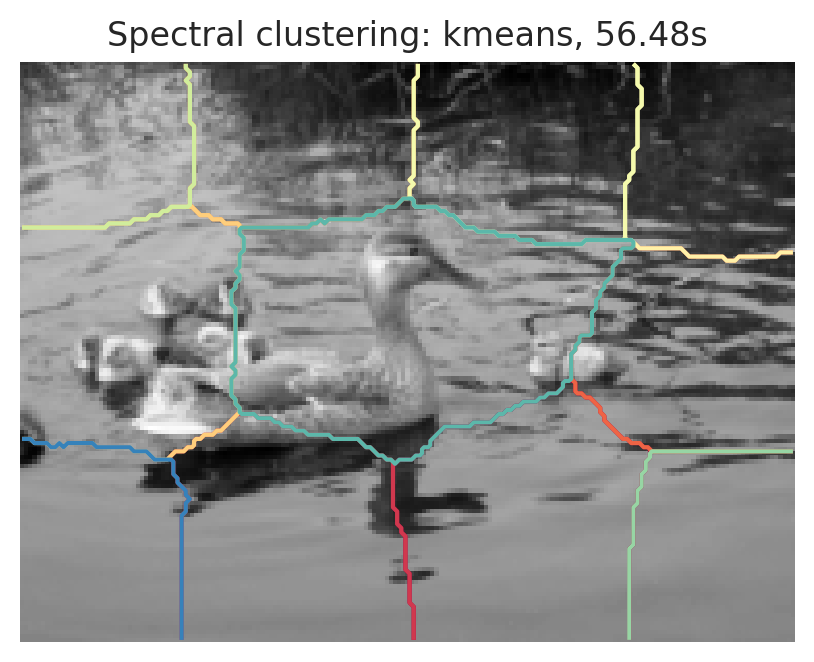

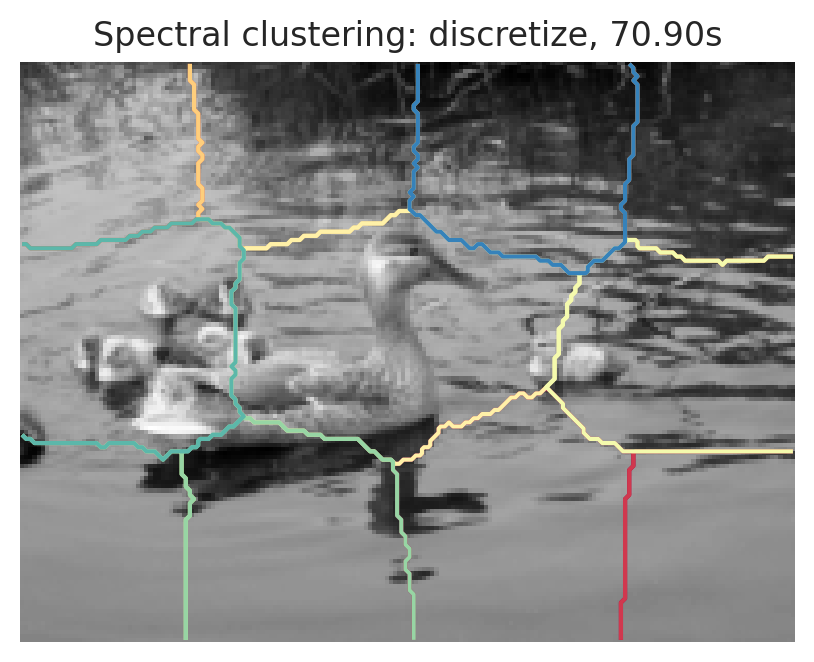

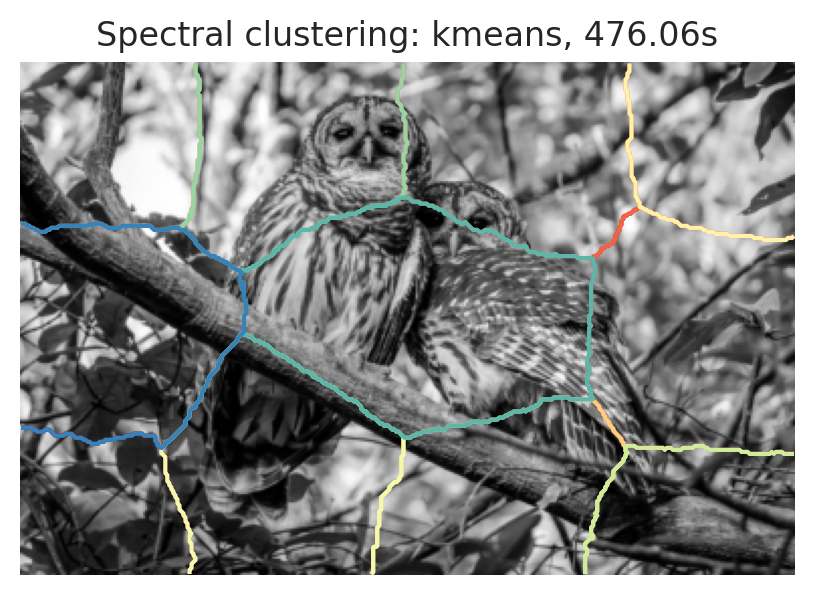

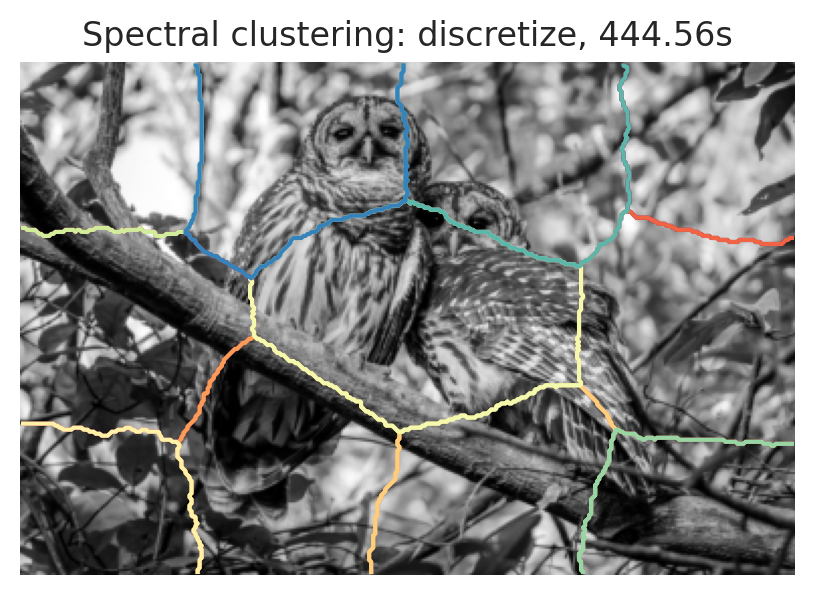

In [107]:
spectral_segmentation('duck.jpg', 11, 5, 0.1)
spectral_segmentation('Owls.jpg', 11, 5, 0.1)

**Спасибо! Вы — человек — большой трудяга!**

Успокоительный котобонус :)

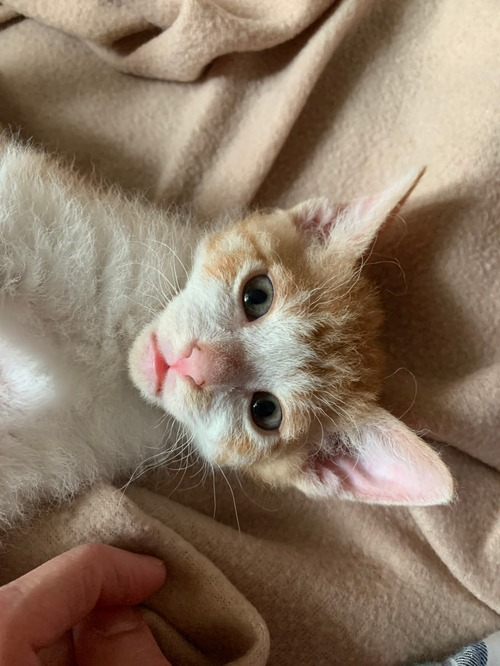

Предположу, что это кот Сабрины!